In [6]:
library(tidyverse)
library(ggplot2)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.0     ✔ purrr   0.3.4
✔ tibble  3.0.1     ✔ dplyr   0.8.5
✔ tidyr   1.1.0     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [2]:
setwd("/Users/tng25/Documents/RW_Lasso")
load("basad.RData")

In [5]:
burn_in <- 5E4

# variable selection -- binary entries
Z <-  fit_basad$allZ[(burn_in + 1):nrow(fit_basad$allZ),-1]

In [7]:
train_input <- read_csv("pria_rmi_cv/file_0.csv")
for(i in 1:4){
  filename <- paste0("pria_rmi_cv/file_",i,".csv")
  train_input <- rbind( train_input, read_csv(file = filename) )
}
test_input <- read_csv("pria_prospective.csv")

# parameters
p <- 1024 # dim size
n_train <- nrow(train_input)
n_test <- nrow(test_input)

# function to process dataset
list_func <- function(input_df){
  # convert character string to columns of predictors and standardize column-wise
  X <- unname( t( sapply( input_df$Fingerprints, function(x){as.numeric(str_split_fixed(x,"",p))} ) ) )
  colnames(X) <- paste0("x", 1:p)
  X <- scale(X)
  
  # center or standardize Y 
  Y <- as.numeric(scale(input_df$Keck_Pria_Continuous))
  # Y <- input_df$Keck_Pria_Continuous - mean(input_df$Keck_Pria_Continuous)
  
  # get list
  return(list(
    X = X,
    Y = Y
  ))
}

train_list <- list_func(train_input)
test_list <- list_func(test_input)

Parsed with column specification:
cols(
  Molecule = col_character(),
  SMILES = col_character(),
  Fingerprints = col_character(),
  Keck_Pria_AS_Retest = col_double(),
  Keck_Pria_FP_data = col_double(),
  Keck_Pria_Continuous = col_double(),
  Keck_RMI_cdd = col_double(),
  `FP counts % inhibition` = col_double()
)

Parsed with column specification:
cols(
  Molecule = col_character(),
  SMILES = col_character(),
  Fingerprints = col_character(),
  Keck_Pria_AS_Retest = col_double(),
  Keck_Pria_FP_data = col_double(),
  Keck_Pria_Continuous = col_double(),
  Keck_RMI_cdd = col_double(),
  `FP counts % inhibition` = col_double()
)

Parsed with column specification:
cols(
  Molecule = col_character(),
  SMILES = col_character(),
  Fingerprints = col_character(),
  Keck_Pria_AS_Retest = col_double(),
  Keck_Pria_FP_data = col_double(),
  Keck_Pria_Continuous = col_double(),
  Keck_RMI_cdd = col_double(),
  `FP counts % inhibition` = col_double()
)

Parsed with column specification:
col

## check trace plots for number of variables selected in successive iterations

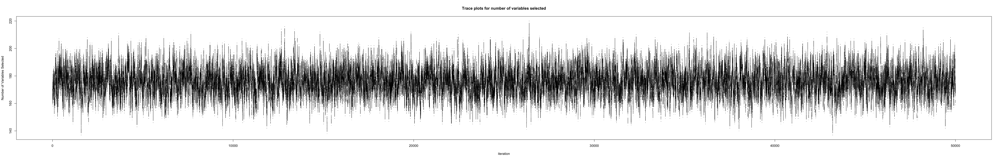

In [4]:
options(repr.plot.width = 50, repr.plot.height = 8)
plot(1:nrow(Z), rowSums(Z), type = "b", pch = ".", xlab = "iteration", ylab = "Number of Variables Selected",
main = "Trace plots for number of variables selected")

## Check trace plots for some coefficients

In [8]:
# sort columns (variables) according to average Pr(variables selected)
beta <- fit_basad$allB[(burn_in + 1):nrow(fit_basad$allB),-1]
colnames(beta) <- names(fit_basad$posteriorZ[-1])
iii_beta <- match( names(sort(fit_basad$posteriorZ[-1])), colnames(beta) ) 
colsort_beta <- beta[,iii_beta]

### trace plots of a few variables with low average Pr(variables selected)

In [9]:
head(fit_basad$posteriorZ[-1][iii_beta]) # check

x348    x952    x509    x859    x244     x49 
0.01430 0.01444 0.01460 0.01478 0.01492 0.01496

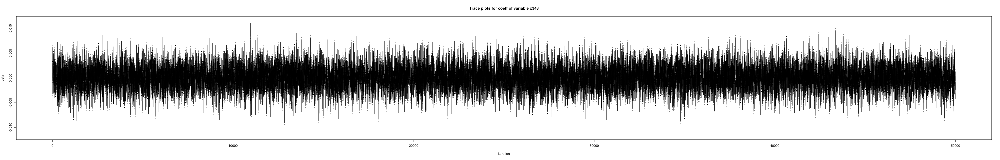

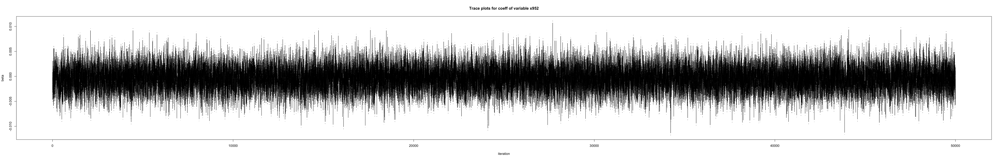

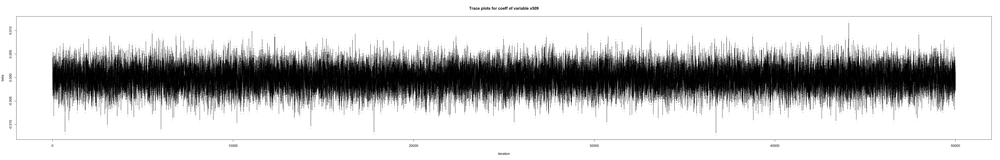

In [10]:
plot(1:nrow(colsort_beta), colsort_beta[,1], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[1]))
plot(1:nrow(colsort_beta), colsort_beta[,2], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[2]))
plot(1:nrow(colsort_beta), colsort_beta[,3], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[3]))

### trace plots of a few variables with high average Pr(variables selected)

In [11]:
tail(fit_basad$posteriorZ[-1][iii_beta]) # check

x726 x762 x828 x894 x916 x940 
   1    1    1    1    1    1

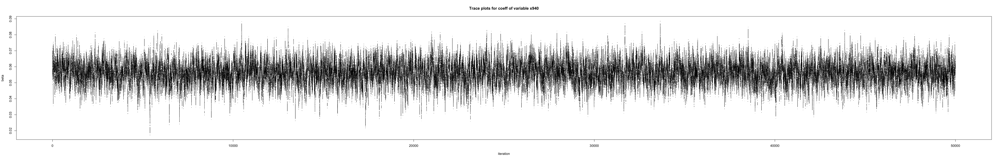

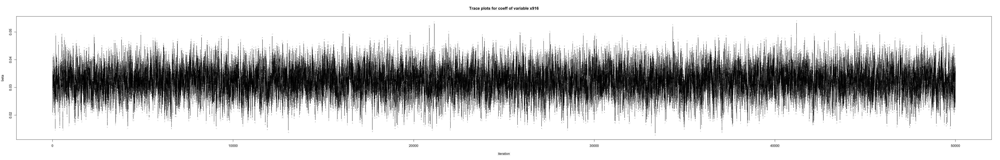

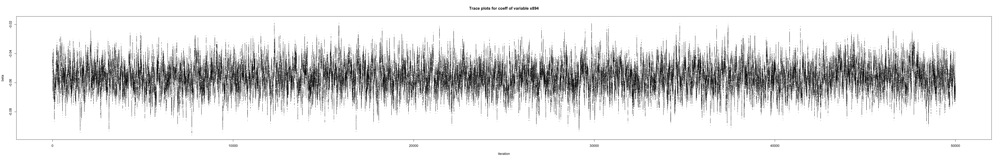

In [12]:
plot(1:nrow(colsort_beta), colsort_beta[,1024], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[1024]))
plot(1:nrow(colsort_beta), colsort_beta[,1023], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[1023]))
plot(1:nrow(colsort_beta), colsort_beta[,1022], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[1022]))

### trace plots of a few variables with medium average Pr(variables selected)

In [13]:
fit_basad$posteriorZ[-1][iii_beta][c(811,812,813)] # check

x440    x830    x391 
0.19402 0.19406 0.19638

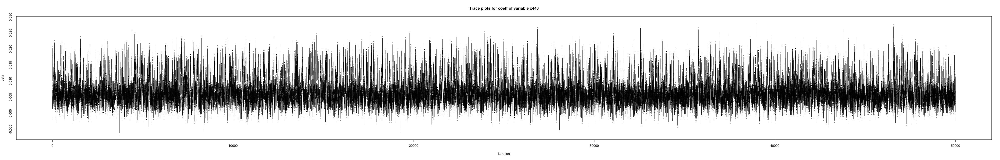

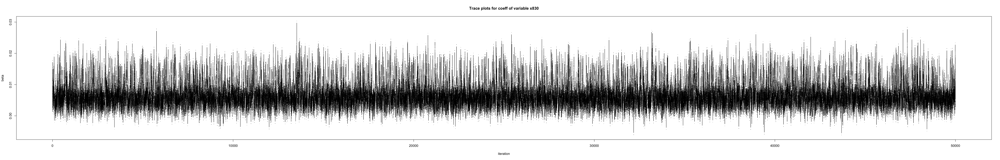

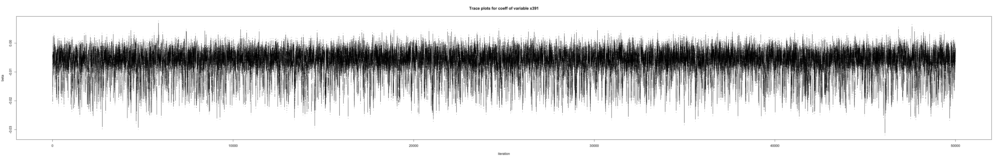

In [14]:
plot(1:nrow(colsort_beta), colsort_beta[,811], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[811]))
plot(1:nrow(colsort_beta), colsort_beta[,812], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[812]))
plot(1:nrow(colsort_beta), colsort_beta[,813], type = "b", pch = ".", xlab = "iteration", 
     ylab = "beta",
     main = paste0("Trace plots for coeff of variable ", colnames(colsort_beta)[813]))

## Check if $X_{\rm train}$ and $X_{\rm test}$ are full-ranked

In [15]:
gram_Xtrain <- crossprod(train_list$X)
gram_Xtest <- crossprod(test_list$X)
eigenval_gram_Xtrain <- eigen(gram_Xtrain)$values
eigenval_gram_Xtest <- eigen(gram_Xtest)$values
max(eigenval_gram_Xtrain) ; min(eigenval_gram_Xtrain)
max(eigenval_gram_Xtest) ; min(eigenval_gram_Xtest)

[1] 604575.4

[1] 4256.41

[1] 195078

[1] 775.2326

## Check trace plot for coefficient of determination $R^2$

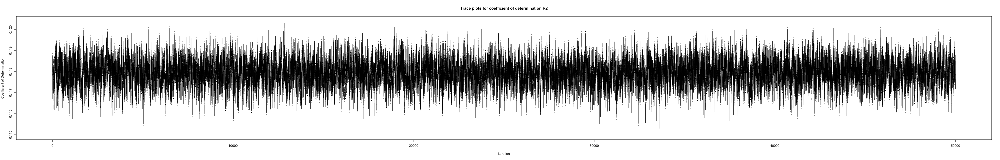

In [16]:
SSTO <- sum( (train_list$Y - mean(train_list$Y))^2 )
load("SSE_train.RData") # get SSE
R2 <- 1 - SSE/SSTO

plot(1:nrow(beta), R2, type = "b", pch = ".", xlab = "iteration", 
     ylab = "Coefficient of Determination",
     main = "Trace plots for coefficient of determination R2")
